In [1]:
!pip install datasets transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 54.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 33.7 MB/s eta 0:00:00


In [2]:
# import os
# print(os.getcwd())
# rdir='/home/hyeryungson'
# os.chdir(os.path.join(rdir, 'mucoco/notebooks'))
# os.chdir(os.path.join(rdir, 'mucoco'))

import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import seaborn as sns
from datasets import load_dataset
from transformers import DataCollatorWithPadding, AutoModelForSequenceClassification, AutoTokenizer, AutoConfig

from viz_attention import get_attention_per_token

In [3]:
%matplotlib inline

In [4]:
# set device type
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Which cpu/cuda?: {DEVICE}")
print(f"Which device?: {torch.cuda.current_device()}")

Which cpu/cuda?: cuda
Which device?: 0


In [5]:
# Define dataset
data = load_dataset("sst2")
# toxicity_data = load_dataset("csv", data_files="./notebooks/results/test_mucoco+add_preds2.csv")
# toxicity_data = load_dataset("json", data_files="./data/toxicity/jigsaw-unintended-bias-in-toxicity-classification/fine-grained/train.jsonl")

# load trained model & tokenizer
# checkpoint='/home/hyeryungson/mucoco/models/models_balanced/roberta-base-jigsaw-toxicity-classifier-with-gpt2-large-embeds/checkpoint_best/pytorch_model.bin' # balanced
# model, tokenizer = define_model(checkpoint, output_attentions=True)

checkpoint = 'distilbert-base-uncased-finetuned-sst-2-english'

labels=[0,1]
config = AutoConfig.from_pretrained(checkpoint, num_labels=len(labels))
config.output_attentions = True ## set this option!
model = AutoModelForSequenceClassification.from_pretrained(checkpoint, config=config)
tokenizer = AutoTokenizer.from_pretrained(checkpoint)

def tokenize_function(example):
    # return tokenizer(example["text"], truncation=True)
    return tokenizer(example["sentence"], truncation=True)

tokenized_dataset=data.map(tokenize_function, batched=True)

# remove unnecessary columns, rename columns
tokenized_dataset = tokenized_dataset.remove_columns(["sentence"]) # drop columns except input_id, labels, attention_mask
tokenized_dataset = tokenized_dataset.rename_column("label", "labels")
tokenized_dataset.set_format("torch")

# select those samples that we want to debug (check attention scores of)
tokenized_dataset_subset = tokenized_dataset["test"]

# build data loader
batch_size = 32
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
subset_dataloader = DataLoader(
    dataset=tokenized_dataset_subset, shuffle=False, batch_size=batch_size, collate_fn=data_collator
)

Generating train split:   0%|          | 0/67349 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/872 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1821 [00:00<?, ? examples/s]

Dataset sst2 downloaded and prepared to /root/.cache/huggingface/datasets/sst2/default/2.0.0/9896208a8d85db057ac50c72282bcb8fe755accc671a57dd8059d4e130961ed5. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

Map:   0%|          | 0/67349 [00:00<?, ? examples/s]

Map:   0%|          | 0/872 [00:00<?, ? examples/s]

Map:   0%|          | 0/1821 [00:00<?, ? examples/s]

Batch:  0


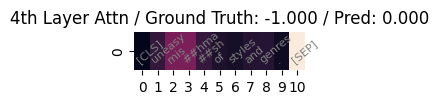

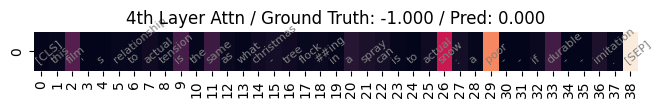

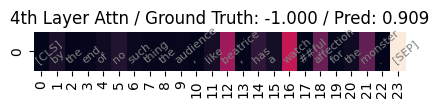

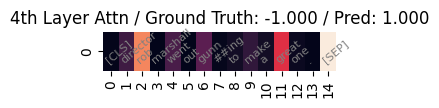

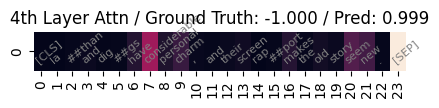

...

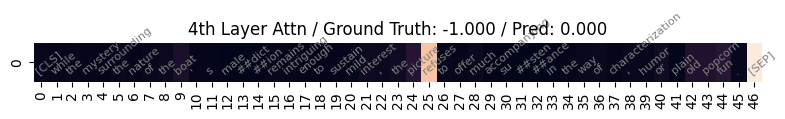

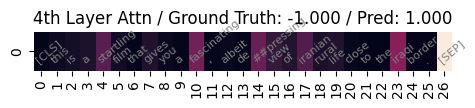

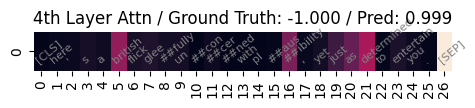

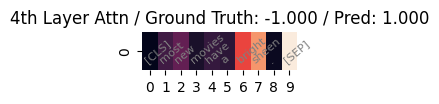

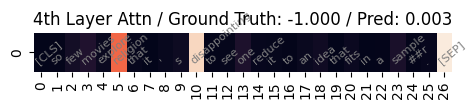

Batch:  1


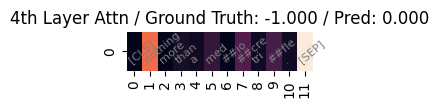

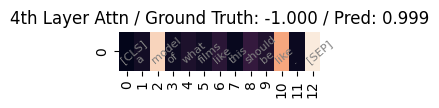

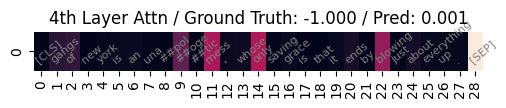

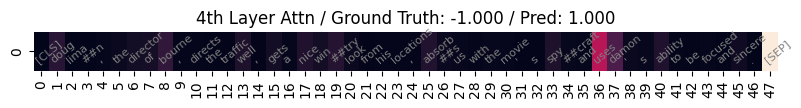

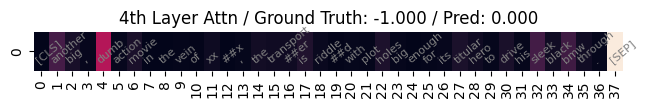

...

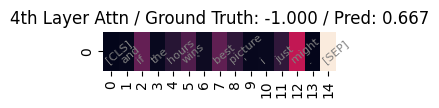

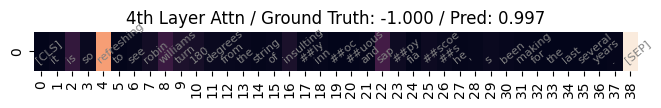

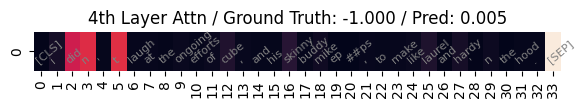

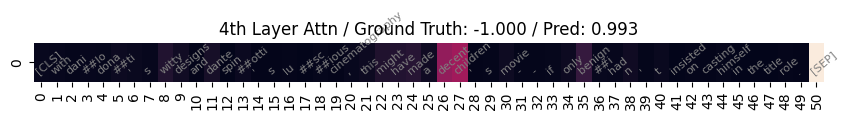

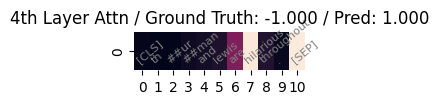

Batch:  2


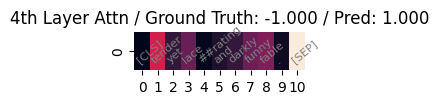

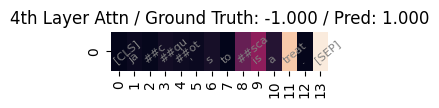

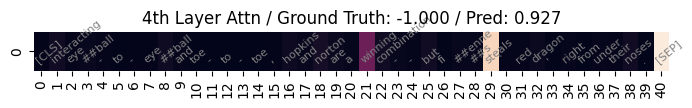

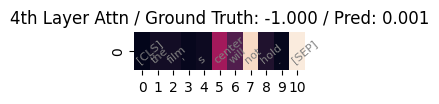

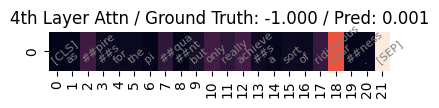

...

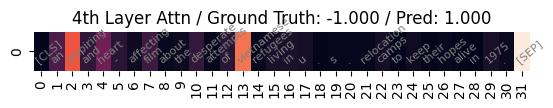

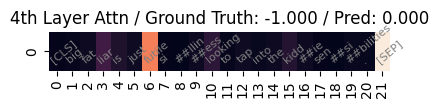

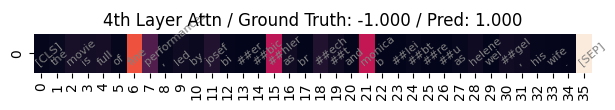

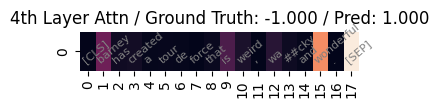

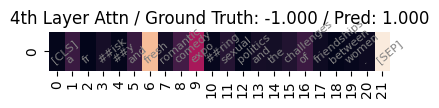

Batch:  3


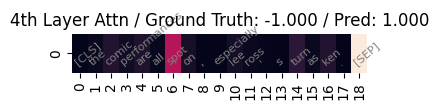

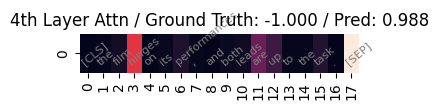

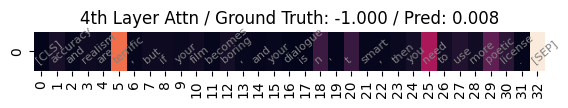

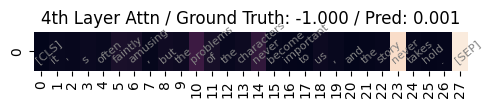

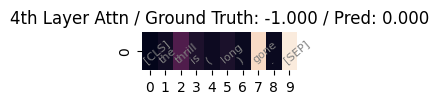

...

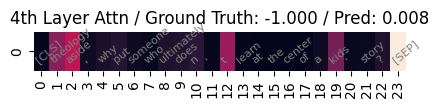

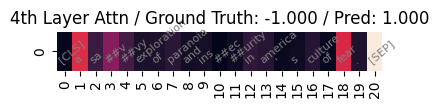

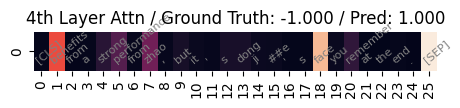

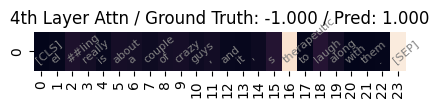

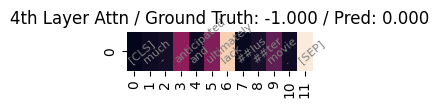

Batch:  4


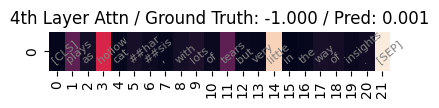

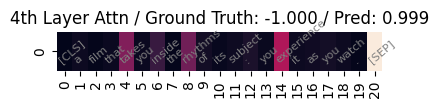

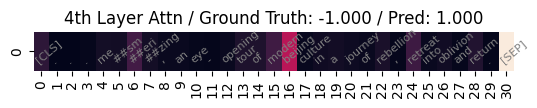

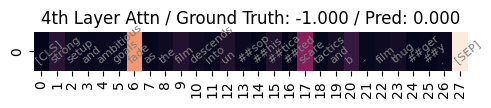

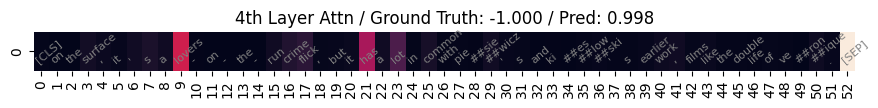

...

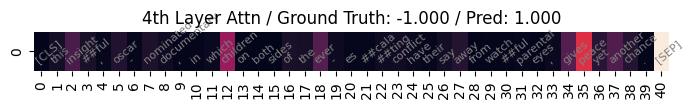

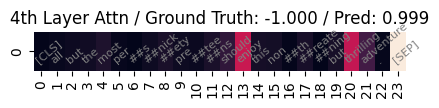

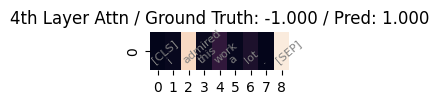

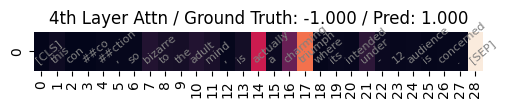

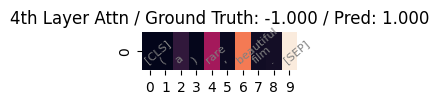

Batch:  5


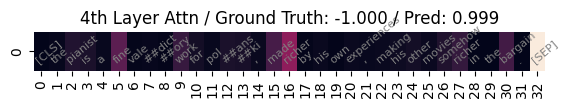

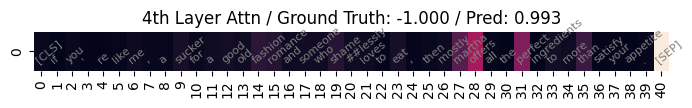

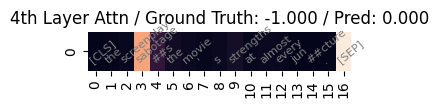

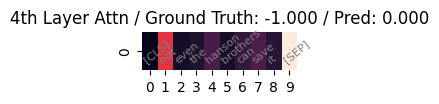

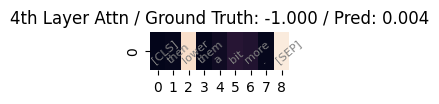

...

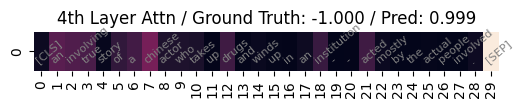

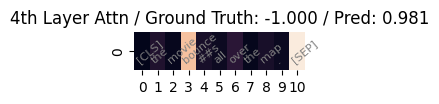

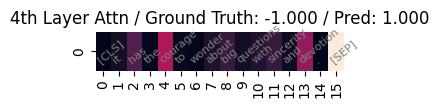

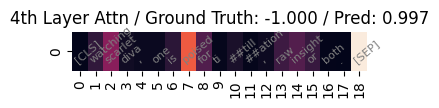

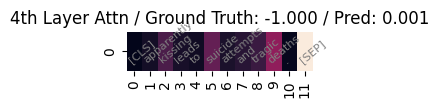

Batch:  6


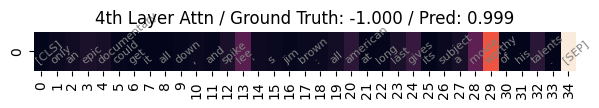

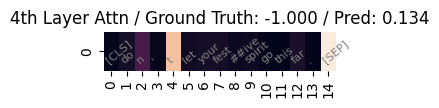

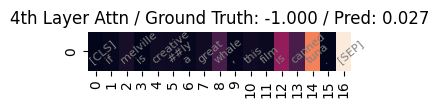

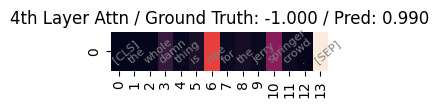

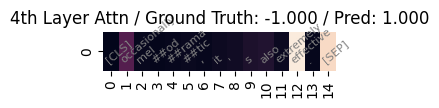

...

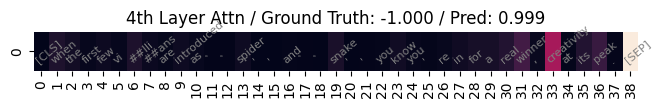

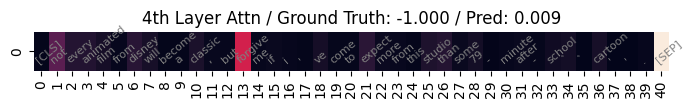

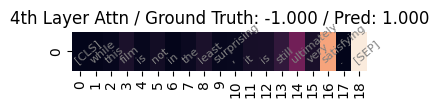

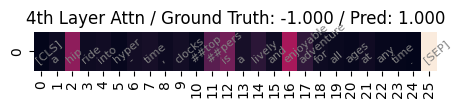

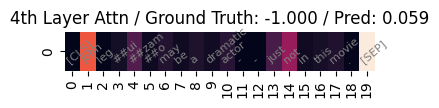

Batch:  7


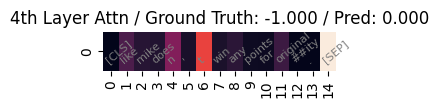

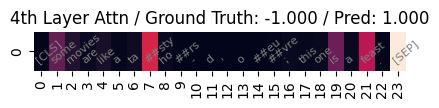

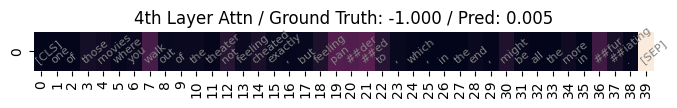

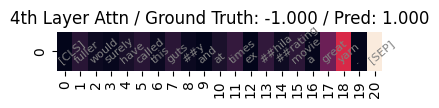

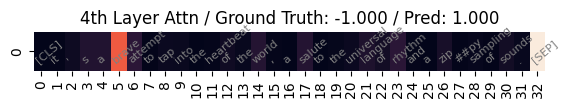

...

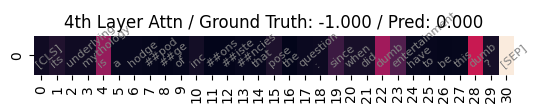

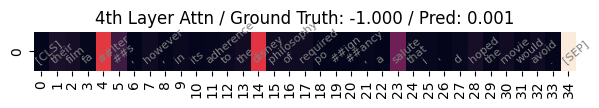

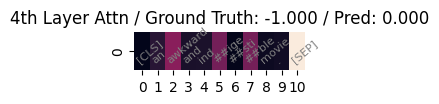

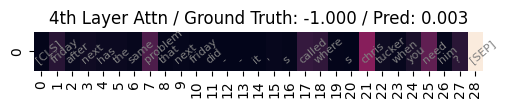

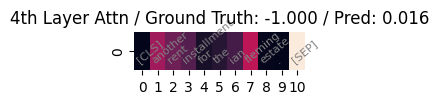

Exception ignored in: <function _xla_gc_callback at 0x7f51d1b29d80>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 103, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


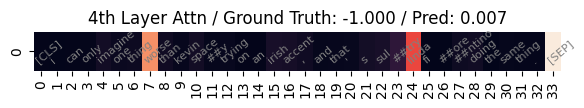

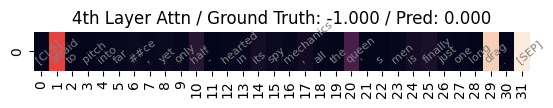

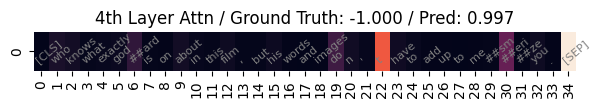

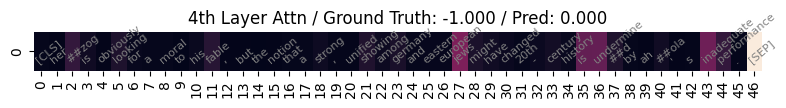

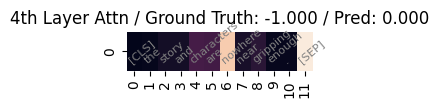

...

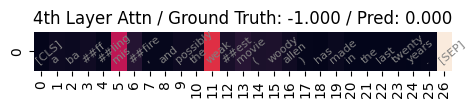

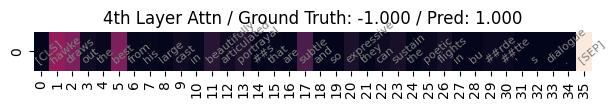

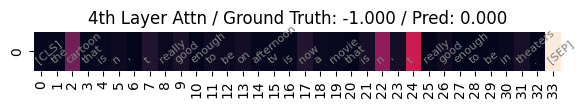

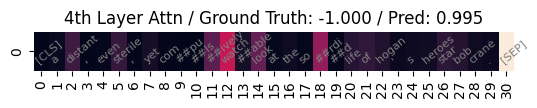

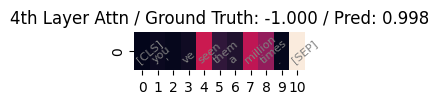

Batch:  8


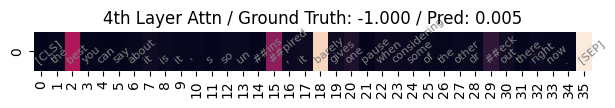

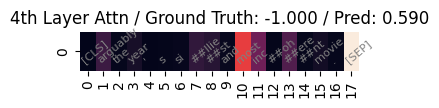

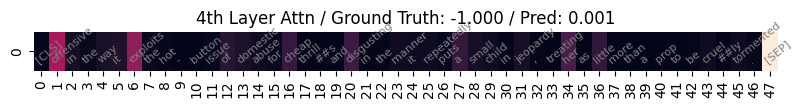

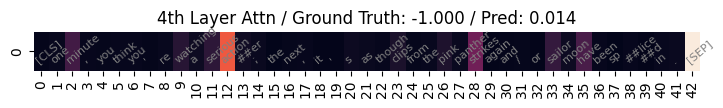

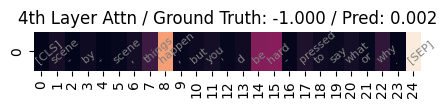

...

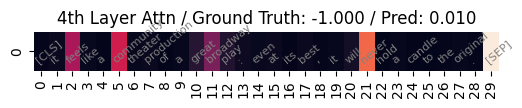

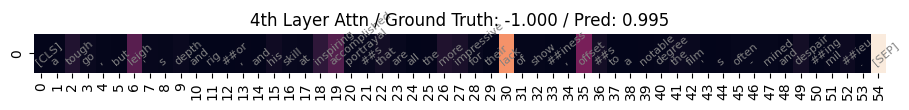

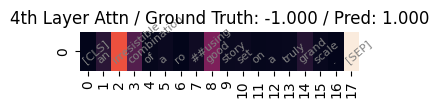

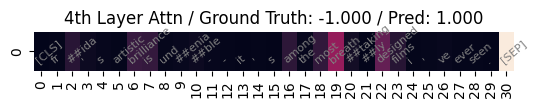

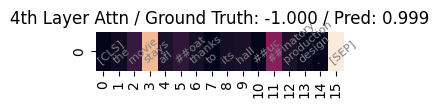

Batch:  9


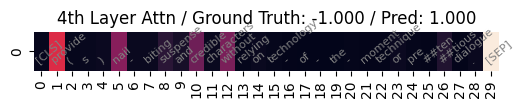

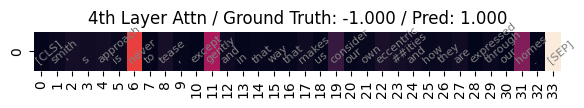

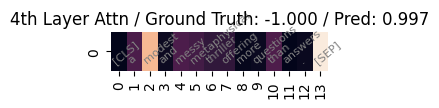

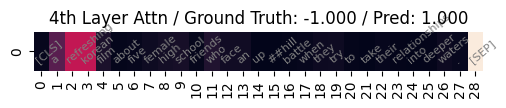

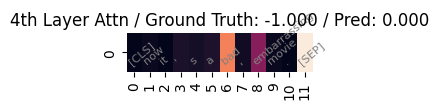

...

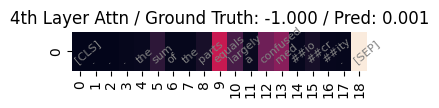

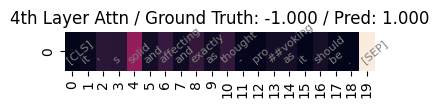

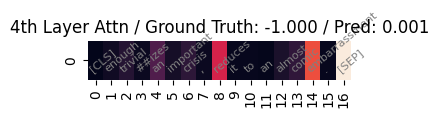

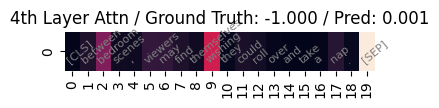

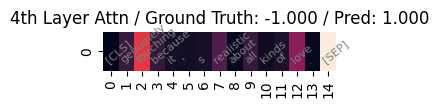

KeyboardInterrupt: ignored

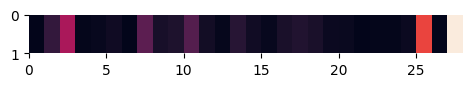

In [48]:
get_attention_per_token(model, subset_dataloader, layer_num=4, pad_token_id=tokenizer.convert_tokens_to_ids('[PAD]'))